In [1]:
import pandas as pd

%load_ext autoreload
%autoreload 2

# Extra options
pd.options.display.max_rows = 30
pd.options.display.max_columns = 25

# Show all code cells outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
%matplotlib agg

import logging
logging.basicConfig(level=logging.INFO)

import os
import osmnx as ox
import sys
import importlib
import numpy as np
import matplotlib.pyplot as plt
from shapely import wkt 
import geopandas as gpd
sys.path.insert(0, os.path.abspath('../../'))

In [2]:
from osmnx_network_extract.network_code import return_crs
from osmnx_network_extract.network_code import NetworkCode

In [3]:
test_location = [1.3707707, 103.7511237] # lat-lon in Singapore (Jurong) 

INFO:numexpr.utils:NumExpr defaulting to 8 threads.
/Users/ejwillemse/opt/anaconda3/envs/waste_labs_examples/lib/python3.8/site-packages/osmnx/plot.py:286: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  plt.show()


204

91

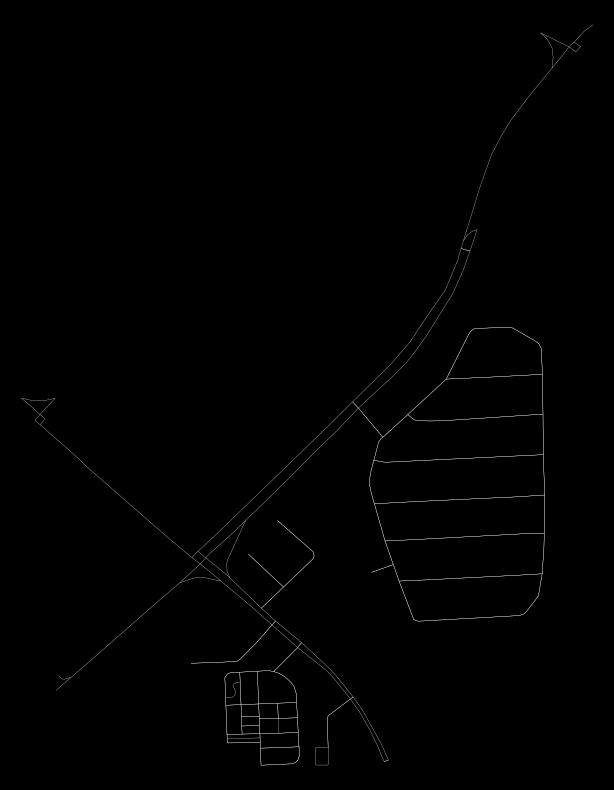

In [4]:
drive_service_all = '["area"!~"yes"]["highway"!~"cycleway|footway|path|pedestrian|steps|track|corridor|elevator|escalator|proposed|construction|bridleway|abandoned|platform|raceway"]["motor_vehicle"!~"no"]["motorcar"!~"no"]'
exclude_emergency_services = '["service"!~"emergency_access"]'
exclude_custom_services = '["access"!~"private"]["service"!~"parking|parking_aisle|private|emergency_access"]'
exclude_parking_privarte_emergency = '["access"!~"private"]["service"!~"parking|private|emergency_access"]'
exclude_private = '["access"!~"private"]["service"!~"private"]'
custom_filter = drive_service_all + exclude_emergency_services

G = ox.graph_from_point(center_point=test_location, dist_type='network', dist=800, custom_filter=custom_filter)
fig, ax = ox.plot_graph(G, node_size=0, edge_color='w', edge_linewidth=0.2, bgcolor='k', fig_height=10)
G.number_of_edges()
G.number_of_nodes()
fig

In [5]:
gdf_graph = ox.graph_to_gdfs(G)
gdf_nodes = gdf_graph[0]
gdf_arcs = gdf_graph[1].copy() # a bi-directional graph is returned, so the network has arcs, not edges.

In [6]:
gdf_nodes['lat'] = gdf_nodes['x'] + np.random.uniform(low=-0.01, high=0.01, size=gdf_nodes.shape[0])
gdf_nodes['lon'] = gdf_nodes['y'] + np.random.uniform(low=-0.01, high=0.01, size=gdf_nodes.shape[0])

In [7]:
gdf_nodes.to_csv('test/customer_points.csv', index=False)

In [8]:
prep_network = pd.read_csv('test/cit_punggol_internal_50m_buffer_contain.csv')

In [9]:
prep_network

,u,v,key,osmid,lanes,highway,service,oneway,length,geometry,name,maxspeed,...,ref,access,junction,width,arc_id,arc_id_orig,u_orig,v_orig,arc_id_ordered,arc_id_ordered_orig,parallel,Name
0,4604559376,4488368046,0,"[753159712, 639706205, 753159711]",4,tertiary,NaN,False,59.830,"LINESTRING (103.8777916 1.3228068, 103.877663 ...",Kallang Way,50,...,NaN,NaN,NaN,NaN,4604559376-4488368046,4604559376-4488368046-0,4.604559e+09,4.488368e+09,4488368046-4604559376,4488368046-4604559376,False,Sub-sector A - City
1,4604559376,5683821101,0,"[666595169, 666595170, 644399321]",2,residential,NaN,False,51.201,"LINESTRING (103.8777916 1.3228068, 103.8777027...",Kallang Way 2A,50,...,NaN,NaN,NaN,NaN,4604559376-5683821101,4604559376-5683821101-0,4.604559e+09,5.683821e+09,4604559376-5683821101,4604559376-5683821101,False,Sub-sector A - City
2,4604559376,4488368055,0,"[764039529, 764039530, 639711921]",4,tertiary,NaN,False,20.401,"LINESTRING (103.8777916 1.3228068, 103.8778413...",Kallang Way,50,...,NaN,NaN,NaN,NaN,4604559376-4488368055,4604559376-4488368055-0,4.604559e+09,4.488368e+09,4488368055-4604559376,4488368055-4604559376,False,Sub-sector A - City
3,385613932,366653047,0,"[383372420, 693663613]",3,motorway,NaN,True,1391.466,"LINESTRING (103.8766693 1.2973415, 103.8767555...",Kallang-Paya Lebar Expressway,80,...,KPE,NaN,NaN,NaN,385613932-366653047,385613932-366653047-0,3.856139e+08,3.666530e+08,385613932-366653047,385613932-366653047-0,False,Sub-sector A - City
4,4604821646,243230385,0,637455171,3,tertiary,NaN,False,35.944,"LINESTRING (103.8991205 1.3264995, 103.8988063...",Ubi Avenue 1,50,...,NaN,NaN,NaN,NaN,4604821646-243230385,4604821646-243230385-0,4.604822e+09,2.432304e+08,243230385-4604821646,243230385-4604821646,False,Sub-sector A - City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26358,77307331507,773073539227,1,543735156,1,service,NaN,True,45.029,"LINESTRING (103.9026901 1.385734, 103.9026142 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307331507-773073539227,5256240692-5256240685-1,5.256241e+09,5.256241e+09,77307331507-773073539227,5256240692-5256240685-1,True,Sub-sector B - Punggol
26359,77307331877,773073539597,1,"[735217973, 543352142]",1,service,parking_aisle,True,92.503,"LINESTRING (103.8930374 1.3724717, 103.89303 1...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307331877-773073539597,5252571177-5252571170-1,5.252571e+09,5.252571e+09,77307331877-773073539597,5252571177-5252571170-1,True,Sub-sector B - Punggol
26360,77307332361,773073540081,0,"[643446253, 599126893, 599126895]",1,service,NaN,True,216.760,"LINESTRING (103.886293 1.3441932, 103.8863292 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307332361-773073540081,5701100079-5701100097-0,5.701100e+09,5.701100e+09,77307332361-773073540081,5701100079-5701100097-0,True,Sub-sector B - Punggol
26361,77307332362,773073540082,1,759531828,1,service,NaN,True,36.106,"LINESTRING (103.886293 1.3441932, 103.8863419 ...",NaN,NaN,...,NaN,NaN,NaN,NaN,77307332362-773073540082,5701100079-5701100097-1,5.701100e+09,5.701100e+09,77307332362-773073540082,5701100079-5701100097-1,True,Sub-sector B - Punggol


In [10]:
prep_network['geometery'] = prep_network['geometry'].apply(wkt.loads)


In [11]:
prep_network['geometery'] = prep_network['geometery'].astype(str)

In [12]:
prep_network['geometery'].apply(wkt.loads)

0        LINESTRING (103.8777916 1.3228068, 103.877663 ...
1        LINESTRING (103.8777916 1.3228068, 103.8777027...
2        LINESTRING (103.8777916 1.3228068, 103.8778413...
3        LINESTRING (103.8766693 1.2973415, 103.8767555...
4        LINESTRING (103.8991205 1.3264995, 103.8988063...
                               ...                        
26358    LINESTRING (103.9026901 1.385734, 103.9026142 ...
26359    LINESTRING (103.8930374 1.3724717, 103.89303 1...
26360    LINESTRING (103.886293 1.3441932, 103.8863292 ...
26361    LINESTRING (103.886293 1.3441932, 103.8863419 ...
26362    LINESTRING (103.8888286 1.3974676, 103.8888319...
Name: geometery, Length: 26363, dtype: object

In [13]:
from osmnx_network_extract.network_code import return_crs
from osmnx_network_extract.network_code import NetworkCode
from osmnx_network_extract.network_code import create_gdf
from osmnx_network_extract.network_code import customer_network_plot

In [14]:
prep_network['geometry'].dtype

dtype('O')

In [15]:
prep_network['points'] = prep_network.apply(lambda x: [y for y in x['geometry'].coords], axis=1)

AttributeError: 'str' object has no attribute 'coords'

In [ ]:
prep_network['points']

In [ ]:
prep_network['u_lat'] = prep_network['points'].apply(lambda x: x[0][1])
prep_network['u_lon'] = prep_network['points'].apply(lambda x: x[0][0])
prep_network['v_lat'] = prep_network['points'].apply(lambda x: x[-1][1])
prep_network['v_lon'] = prep_network['points'].apply(lambda x: x[-1][0])

In [ ]:
prep_network_u = prep_network[['u', 'u_lon', 'u_lat']]
prep_network_u.columns = ['u',  'x', 'y']
prep_network_v = prep_network[['v', 'v_lon', 'v_lat']]
prep_network_v.columns = ['u', 'x', 'y']

In [ ]:
prep_network_nodes = pd.concat([prep_network_u, prep_network_v])

In [ ]:
prep_network_nodes = prep_network_nodes.drop_duplicates()

In [ ]:
prep_network_nodes = prep_network_nodes.set_index(['u'], drop=False, )

In [ ]:
from osmnx_network_extract.network_code import extract_node_gdf

In [ ]:
df_node_test = extract_node_gdf(gdf_arcs, crs='EPSG:3414')
df_node_test = 

In [ ]:
df_node_test_two = df_node_test.merge(gdf_nodes, how='left', left_index=True, right_index=True)

In [ ]:
(df_node_test_two['x_x'] == df_node_test_two['x_y']).all()
(df_node_test_two['y_x'] == df_node_test_two['y_y']).all()

## Full network test

In [19]:
geocode_network = NetworkCode(prep_network, 'SG', xy_converted=False)

gdf_customers = geocode_network.create_nodes_gdf(geocode_network.df_network)

gdf_customers['lat'] = gdf_customers['y']  + np.random.uniform(low=-0.001, high=0.001, size=gdf_customers.shape[0])
gdf_customers['lon'] = gdf_customers['x']  + np.random.uniform(low=-0.001, high=0.001, size=gdf_customers.shape[0])

In [20]:
from osmnx_network_extract.network_code import create_latlon_gdf

In [21]:
gdf_customers = create_latlon_gdf(gdf_customers, 'EPSG:4326')

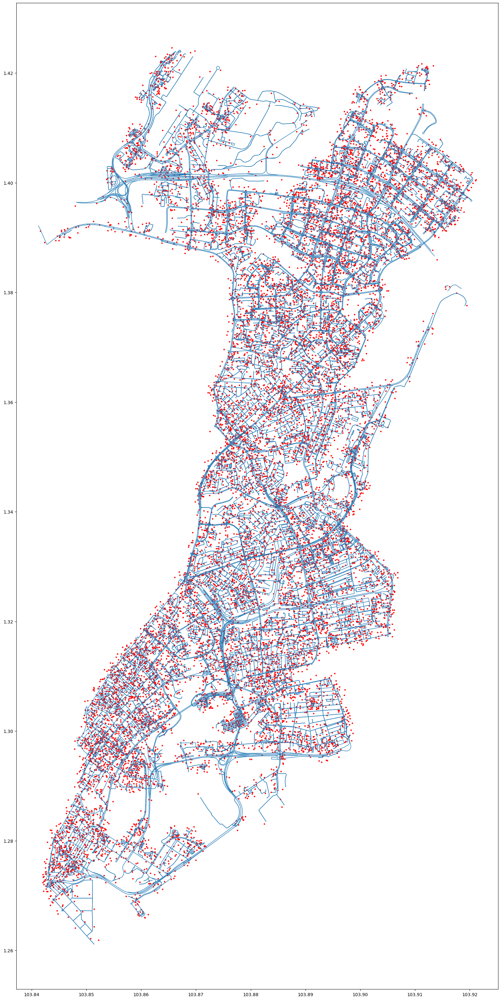

In [22]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = gdf_customers.plot(ax=ax, markersize=5, facecolor='red')
_ = geocode_network.df_network.plot(ax=ax, linewidth=1)
fig

In [23]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

INFO:root:Convert network to x-y
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.


In [24]:
geocode_network2.add_customers(gdf_customers)
gdf_customers = geocode_network2.df.copy()

INFO:root:Adding 14919 customers.


In [25]:
prep_network['arc_id_ordered'].isin(geocode_network2.df_network['arc_id_ordered']).all()

True

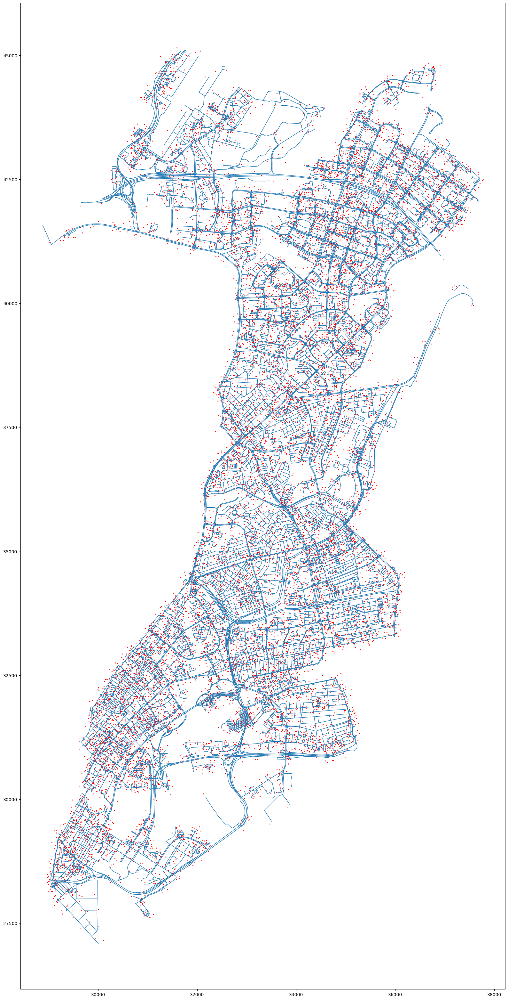

In [26]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=1.5, facecolor='red')
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
fig

In [27]:
geocode_network2.filter_network(['residential'])

INFO:root:Filtering network on: highway
INFO:root:Arcs removed: 14133


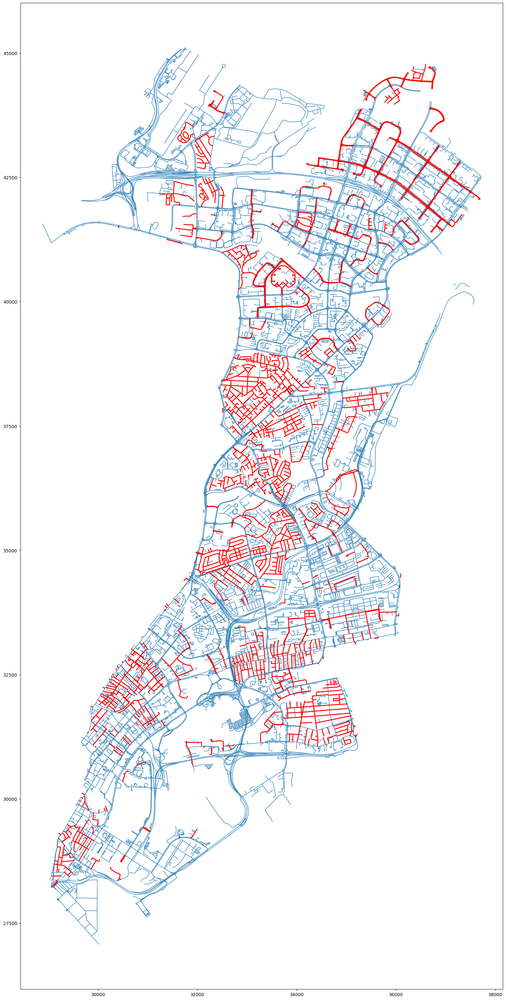

In [28]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=2, color='red')
fig

In [29]:
geocode_network2.add_customers(gdf_customers.iloc[:1000], gdf_convert=False)

INFO:root:Adding 1000 customers.


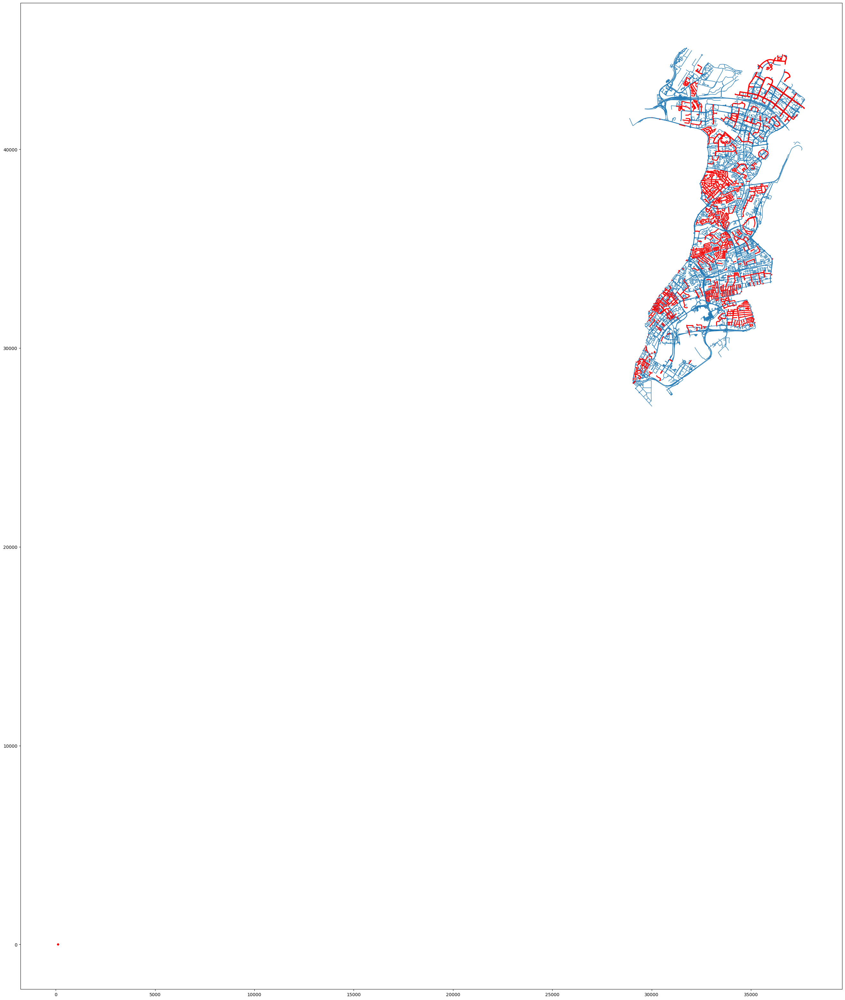

In [30]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=10, facecolor='red')
_ = geocode_network2.df_network.plot(ax=ax, linewidth=1)
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=2, color='red')
fig

In [31]:
geocode_network2 = NetworkCode(prep_network, 'SG', xy_converted=True)
geocode_network2.convert_direct()
geocode_network2.add_customers(gdf_customers, gdf_convert=False)

INFO:root:Convert network to x-y
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.
INFO:root:Adding 14919 customers.


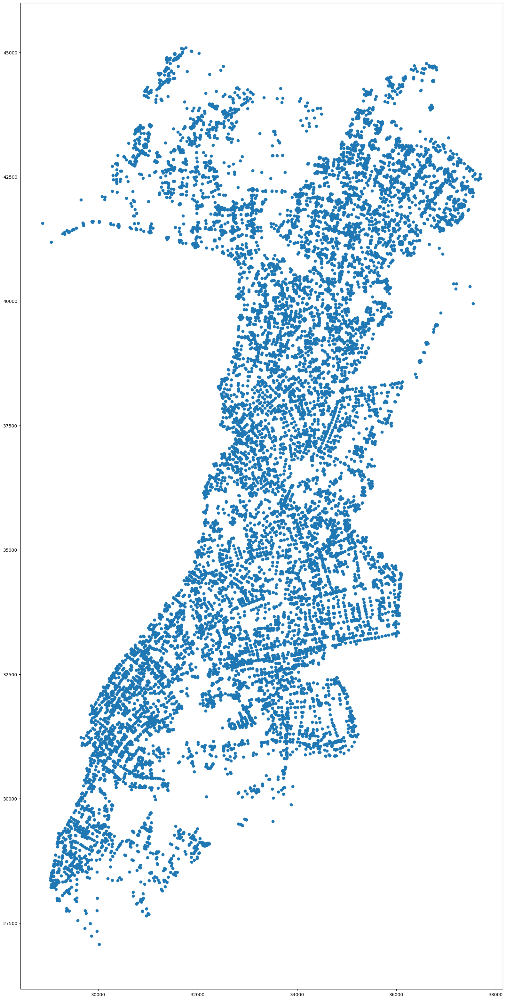

In [32]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df_nodes_filter.plot(ax=ax)
fig

In [33]:
%%time
df_customer_fit = geocode_network2.snapping_points(dist=30)

AttributeError: 'NetworkCode' object has no attribute 'snapping_points'

In [34]:
df_customer_fit = df_customer_fit.set_geometry('geometry_u', crs='EPSG:4326')
df_customer_fit = df_customer_fit.to_crs('EPSG:3414')

NameError: name 'df_customer_fit' is not defined

In [35]:
df_customer_fit

NameError: name 'df_customer_fit' is not defined

In [36]:
fig, ax = plt.subplots(figsize = (40, 40)) 
_ = geocode_network2.df.plot(ax=ax, markersize=5, facecolor='blue')
_ = geocode_network2.df_network_filter.plot(ax=ax, linewidth=1, color='green')
_ = df_customer_fit.plot(ax=ax, markersize=10, facecolor='red')
fig

NameError: name 'df_customer_fit' is not defined

In [37]:
from visualise.customer_plots import return_scatter_layer, color_df, return_arc_layer
import pydeck as pdk

In [38]:
with open('../../keys/mapbox_key.txt', 'r') as f:
    mapbox_key = f.readline()

In [39]:
plt_map = df_customer_fit[['lon', 'lat', 'lon_u', 'lat_u', 'dist_u']].copy()

NameError: name 'df_customer_fit' is not defined

In [40]:
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_u', 'lon_u', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_u', 'lon_u', [250, 0, 0, 250], [250, 250, 0, 250])

NameError: name 'plt_map' is not defined

In [41]:
viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

NameError: name 'plt_map' is not defined

In [42]:
r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

NameError: name 'scatter_orig' is not defined

## Small examples

In [43]:
geocode_network2 = NetworkCode(prep_network.iloc[:1000], 'SG')
geocode_network2.convert_direct()

INFO:root:Convert network to x-y
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 159.


In [190]:
temp_customers = gdf_customers.iloc[:100].copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)

In [191]:
geocode_network2.add_customers(temp_customers)

In [198]:
geocode_network2.find_nearest_collection_point()

In [199]:
geocode_network2.convert_geometries_latlon()

In [200]:
df_customer_fit = geocode_network2.df_collection_points

In [202]:
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

In [203]:
viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

In [204]:
r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3123689182767708, "longitude": 103.8…

## Full examples auto

In [211]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

temp_customers = gdf_customers.copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)
geocode_network2.add_customers(temp_customers)
geocode_network2.find_nearest_collection_point()

df_customer_fit = geocode_network2.df_collection_points
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

INFO:root:Convert network to lat-lon
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.
INFO:root:Adding 14919 customers.
INFO:root:Find nearest arc
INFO:root:Number of arcs 18425 number of points 14919
INFO:root:Find closest assigned end point
INFO:root:Find closest point on assigned arc
INFO:root:Find best collection point


DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3473870490680833, "longitude": 103.8…

## Full examples residential

In [235]:
geocode_network2 = NetworkCode(prep_network, 'SG')
geocode_network2.convert_direct()

temp_customers = gdf_customers.copy()
temp_customers = temp_customers[['lat', 'lon']]
temp_customers['u_id'] = temp_customers.index
temp_customers = temp_customers.reset_index(drop=True)
geocode_network2.add_customers(temp_customers)
geocode_network2.filter_network(['residential'])
geocode_network2.find_nearest_collection_point()

INFO:root:Convert network to x-y
INFO:root:Extracting nodes from network
INFO:root:Removing opposing network arcs (only need one).
INFO:root:Arcs removed: 7938.
INFO:root:Adding 14919 customers.
INFO:root:Filtering network on: highway
INFO:root:Arcs removed: 14133
INFO:root:Find nearest arc
INFO:root:Number of arcs 4292 number of points 14919
INFO:root:Find closest assigned end point
INFO:root:Find closest point on assigned arc
INFO:root:Find best collection point


In [236]:
df_customer_fit = geocode_network2.df_collection_points
plt_map = df_customer_fit[['lon', 'lat', 'lon_collect', 'lat_collect', 'dist_collect', 'arc_collect']].copy()
scatter_orig = return_scatter_layer(plt_map, 'original', 'lat', 'lon', [250, 0, 0, 250])
scatter_new = return_scatter_layer(plt_map, 'snapped', 'lat_collect', 'lon_collect', [250, 250, 0, 250])
arcs = return_arc_layer(plt_map, 'arcs', 'lat', 'lon', 'lat_collect', 'lon_collect', [250, 0, 0, 250], [250, 250, 0, 250])

viewport = pdk.data_utils.compute_view(points=plt_map[['lon', 'lat']], view_proportion=0.95)

r = pdk.Deck(layers=[scatter_orig, scatter_new, arcs], 
              initial_view_state=viewport, 
              mapbox_key = mapbox_key, 
              height = 1250,
              width = 1250
             )
r.show()

DeckGLWidget(height=1250, json_input='{"initialViewState": {"latitude": 1.3473870490680748, "longitude": 103.8…